In [5]:
from pathlib import Path
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import cv2

import torch.optim as optim
import torch.nn as nn

import itertools

In [3]:
dpath = Path('../data/')
chxpath = dpath/'CheXpert-v1.0-small/'
path_train = chxpath/'train'
path_valid = chxpath/'valid'
path_tmplt = Path('templates')

In [32]:
frontal10 = [*map(str,itertools.islice(path_train.glob('**/v*frontal.jpg'),10))]
lateral10 = [*map(str,itertools.islice(path_train.glob('**/v*lateral.jpg'),10))]

frontal10val = [*map(str,itertools.islice(path_valid.glob('**/v*frontal.jpg'),10))]

In [37]:
def apply_clahe(impath, savename_bef, savename_aft, cliplim=2.0, tgrid_size=(8,8)):
    clahe = cv2.createCLAHE(clipLimit=cliplim, tileGridSize=tgrid_size)
    
    img = cv2.imread(impath, cv2.IMREAD_UNCHANGED)
    plt.imsave(savename_bef, cv2.cvtColor(img, cv2.COLOR_GRAY2BGR))
    
    cl_img = clahe.apply(img)
    climg3 = cv2.cvtColor(cl_img, cv2.COLOR_GRAY2BGR)
    plt.imsave(savename_aft, climg3)
    
    fig,axes = plt.subplots(1,2, figsize=(8,10))
    
    axes[0].imshow(cv2.cvtColor(img, cv2.COLOR_GRAY2BGR))
    axes[0].set_title('Original')
    
    cl_img = clahe.apply(img)
    climg3 = cv2.cvtColor(cl_img, cv2.COLOR_GRAY2BGR)
    
    axes[1].imshow(climg3)
    axes[1].set_title('CLAHE')
    
    axes[0].axis('off')
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()

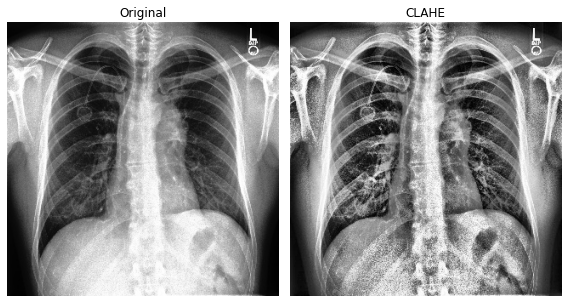

In [38]:
apply_clahe(frontal10[5], 'frontal_clahe4_before.jpg', 'frontal_clahe4_after.jpg', 4.0)

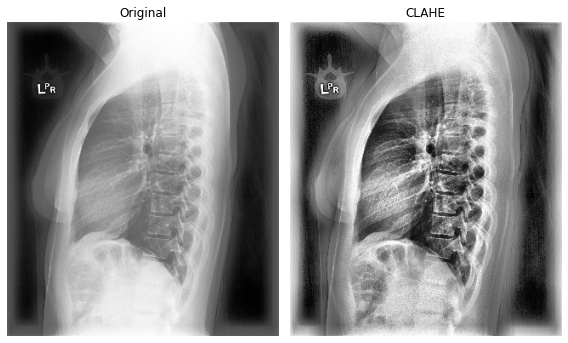

In [39]:
apply_clahe(lateral10[1], 'lateral_clahe4_before.jpg', 'lateral_clahe4_after.jpg', 4.0)

In [ ]:
good_opts = [3,4,5]

In [ ]:
# lateral = 1

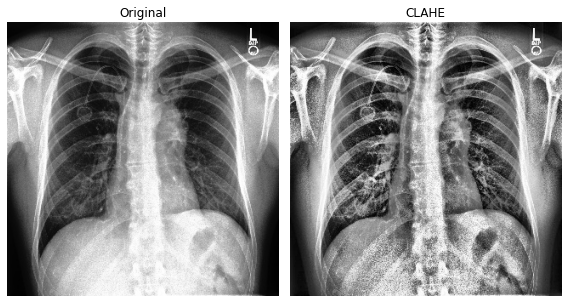

In [36]:
apply_clahe(frontal10[5],4.0)

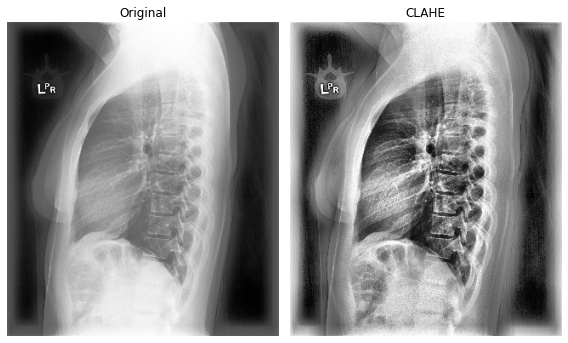

In [35]:
apply_clahe(lateral10[1],4.0)

0


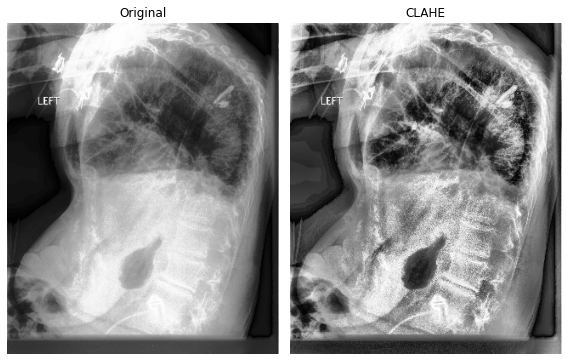

1


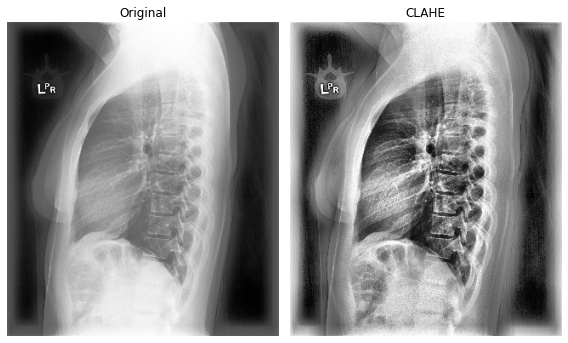

2


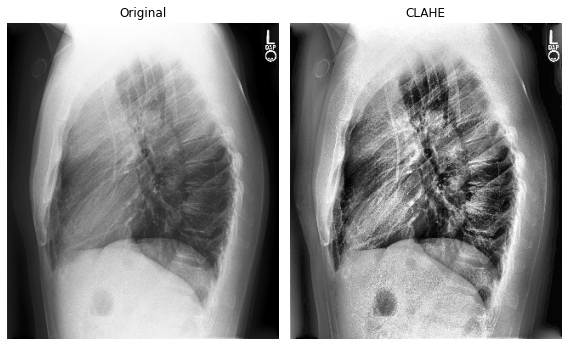

3


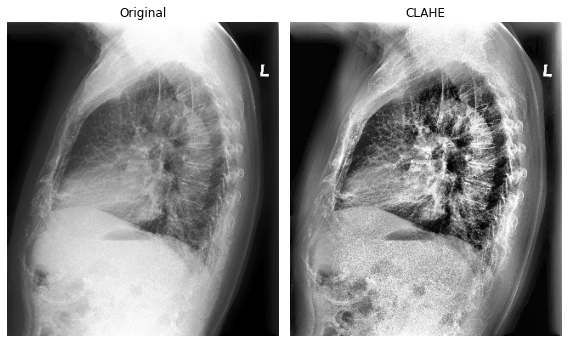

4


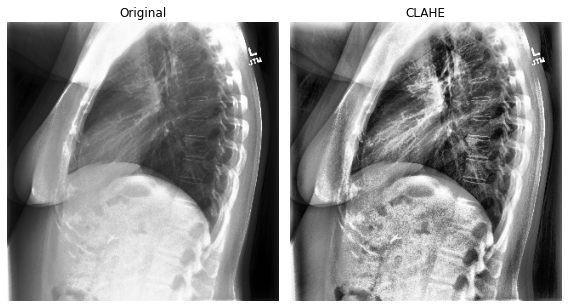

5


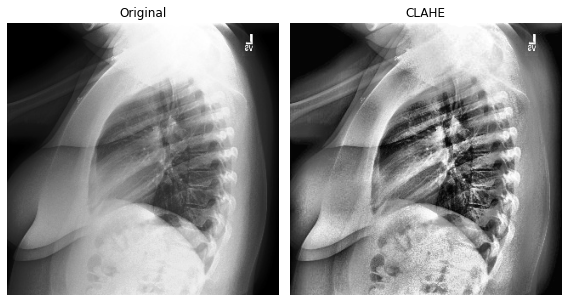

6


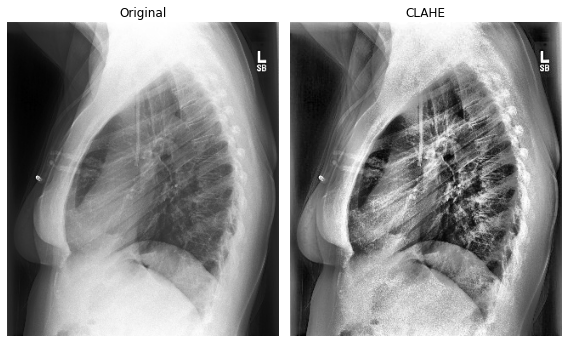

7


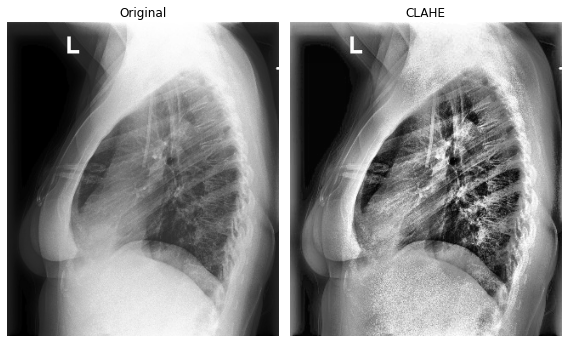

8


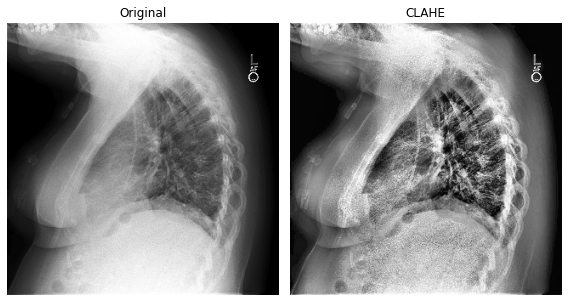

9


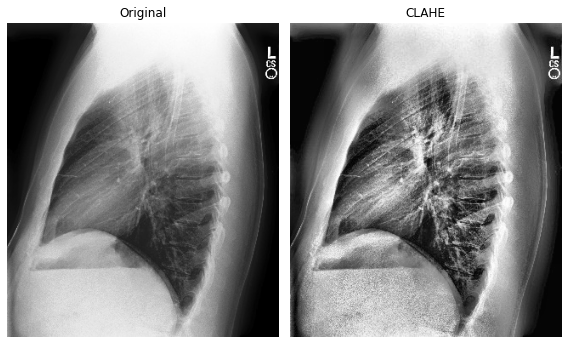

In [34]:
for i in range(10):
    print(i)
    apply_clahe(lateral10[i],4.0)

0


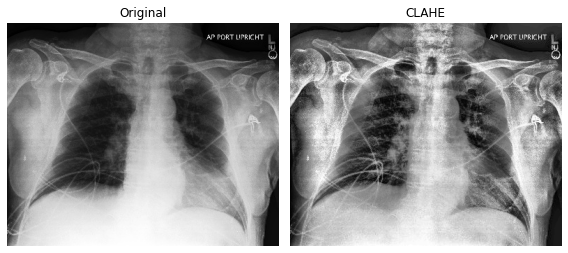

1


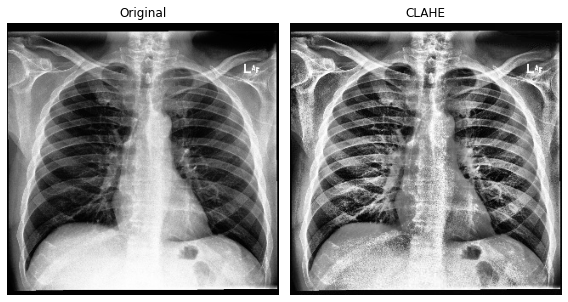

2


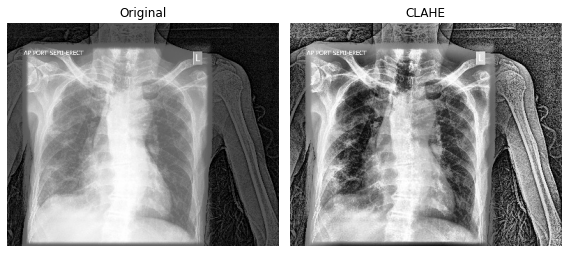

3


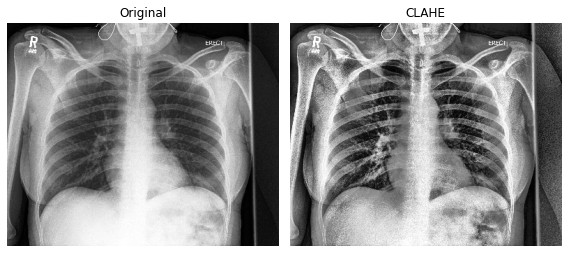

4


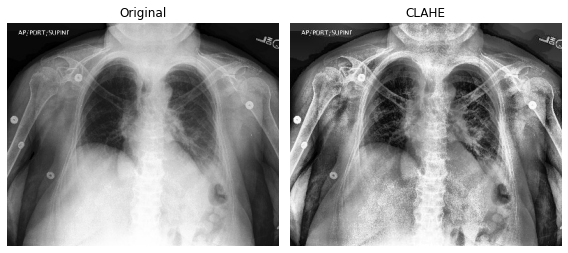

5


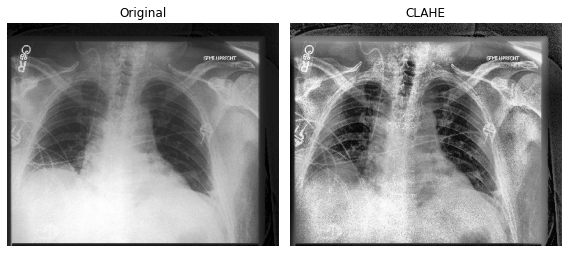

6


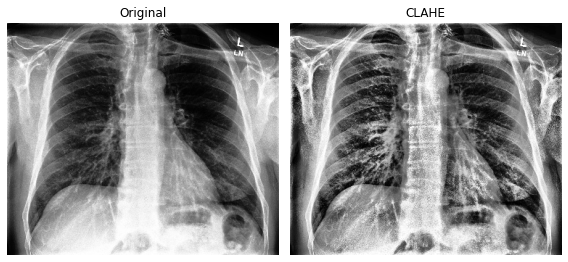

7


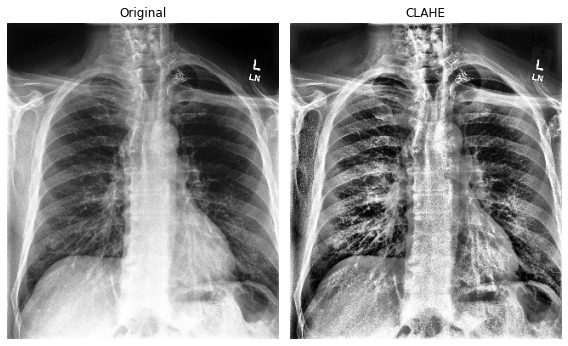

8


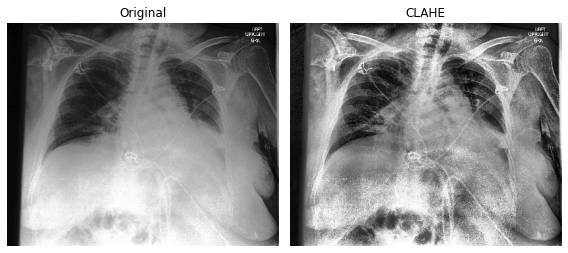

9


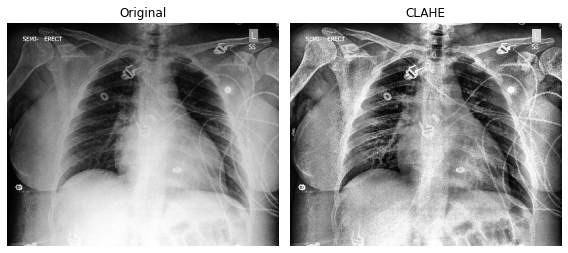

In [33]:
for i in range(10):
    print(i)
    apply_clahe(frontal10val[i],4.0)

0


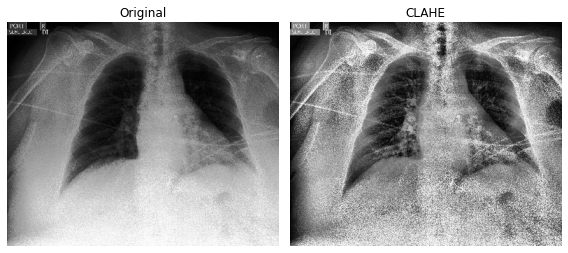

1


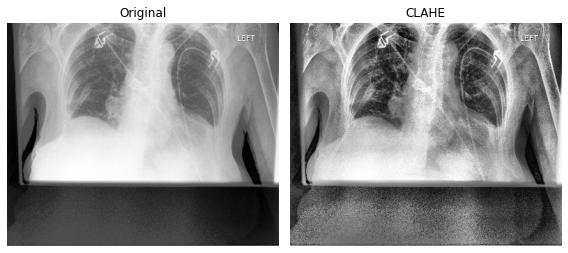

2


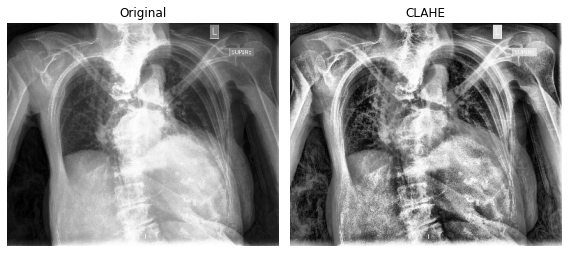

3


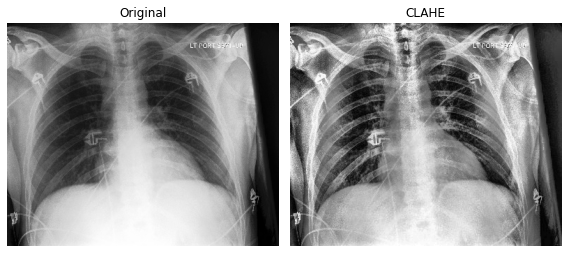

4


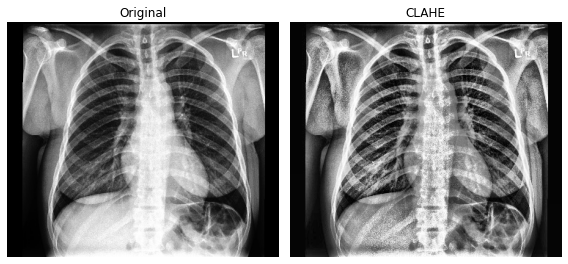

5


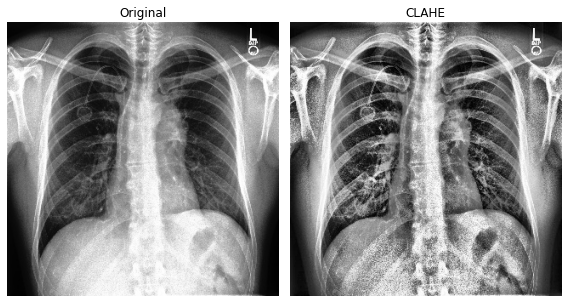

6


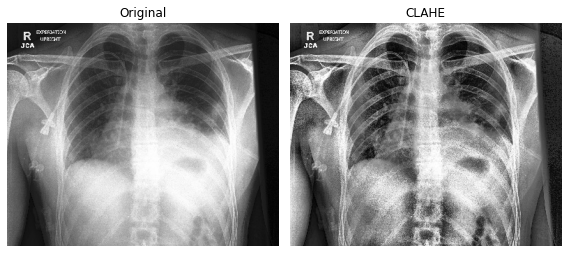

7


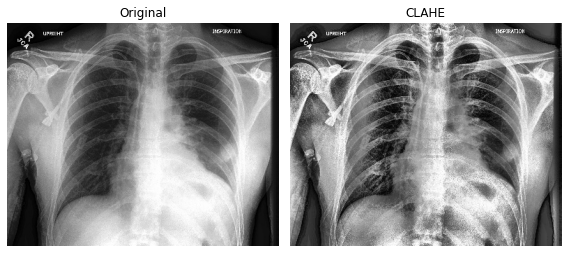

8


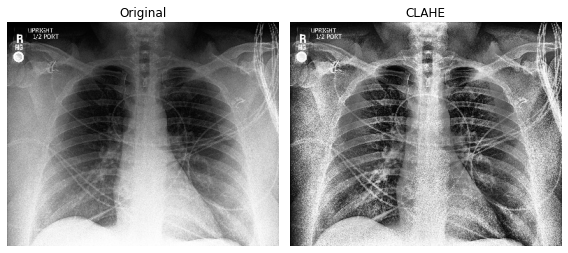

9


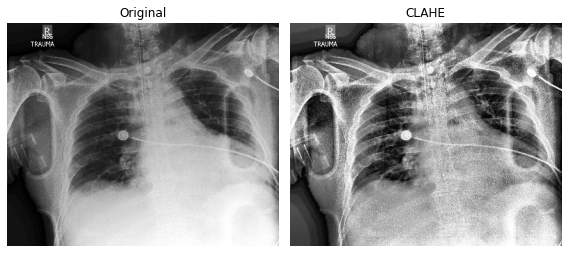

In [31]:
for i in range(10):
    print(i)
    apply_clahe(frontal10[i],4.0)

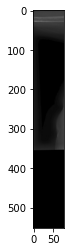

In [35]:
im = cv2.imread(lateral10[48])
#---- 4 corner points of the bounding box
pts_src = np.array([[17.0,0.0], [77.0,5.0], [0.0, 552.0],[53.0, 552.0]])

#---- 4 corner points of the black image you want to impose it on
pts_dst = np.array([[0.0,0.0],[77.0, 0.0],[ 0.0,552.0],[77.0, 552.0]])

#---- forming the black image of specific size
im_dst = np.zeros((552, 77, 3), np.uint8)

#---- Framing the homography matrix
h, status = cv2.findHomography(pts_src, pts_dst)

#---- transforming the image bound in the rectangle to straighten
im_out = cv2.warpPerspective(im, h, (im_dst.shape[1],im_dst.shape[0]))
plt.imshow(im_out)
#cv2.imwrite("im_out.jpg", im_out)

In [24]:
cv2.imread(frontal10[0], 0)

array([[  1,   0,  49, ...,   0,   0,   0],
       [  3,   1,  50, ...,   1,   1,   1],
       [  0,   0,  49, ...,   0,   0,   0],
       ...,
       [157, 167, 178, ..., 226, 229, 238],
       [165, 172, 164, ..., 255, 234, 240],
       [176, 198, 163, ..., 245, 232, 230]], dtype=uint8)

In [299]:
%timeit 'lateral' in lateral10[0]

109 ns ± 3.58 ns per loop (mean ± std. dev. of 7 runs, 10000000 loops each)


In [300]:
%timeit lateral10[0].find('lateral') != -1

274 ns ± 7.22 ns per loop (mean ± std. dev. of 7 runs, 1000000 loops each)


In [85]:
# Set the path where image files are
#path = '/Users/IT0094_Duo/Documents/test/train/'
#files = path_train.glob('*.jpg')#glob.glob(path + '*.jpg')
frontal10 = [*map(str,itertools.islice(path_train.glob('**/v*frontal.jpg'),10))]
lateral10 = [*map(str,itertools.islice(path_train.glob('**/v*lateral.jpg'),10))]

frontal10val = [*map(str,itertools.islice(path_valid.glob('**/v*frontal.jpg'),10))]

ext_template = str(path_tmplt/'external_template1.jpg')

In [289]:
ext_tmpl_frnt = str(path_tmplt/'fnt_ext_template244.jpg')
ext_tmpl_lat = str(path_tmplt/'lat_ext_template244.png')
TEMPLATE = cv2.imread(ext_tmpl_frnt)
TEMPLATE1c = cv2.cvtColor(TEMPLATE, cv2.COLOR_BGR2GRAY)
def template_match_min(img, template, tm_method=cv2.TM_CCOEFF_NORMED):
    h,w = template.shape
    if img.ndim > 2:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    img1c256 = cv2.resize(img, (256,256), interpolation=cv2.INTER_LINEAR)

    res = cv2.matchTemplate(img1c256, template, tm_method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    top_left = max_loc if tm_method not in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED] else min_loc
    bottom_right = (top_left[0] + w, top_left[1]+h)
    (x,y),(x1,y1) = top_left, bottom_right
    
    return cv2.cvtColor(img1c256[y:y1, x:x1], cv2.COLOR_GRAY2BGR)

In [294]:
0.00105*220000

230.99999999999997

In [288]:
imgs[0].shape

(320, 389, 3)

In [290]:
imgs = [cv2.imread(imp) for imp in frontal10]

In [293]:
%timeit template_match_min(imgs[0], TEMPLATE1c)

1.05 ms ± 37.2 µs per loop (mean ± std. dev. of 7 runs, 1000 loops each)


In [292]:
%%timeit
[template_match_min(im, TEMPLATE1c) for im in imgs]

10.6 ms ± 38.2 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


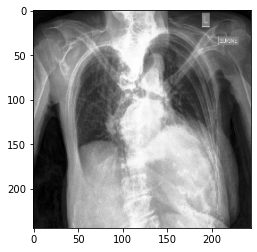

In [277]:
tmp_tm0 =template_match_min(frontal10[2])
plt.imshow(tmp_tm0)

In [251]:
#method = eval('cv2.TM_CCOEFF') # TM_CCOEFF is one of the methods. 
# Other methods include: cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR, cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED
    
#tm_methods = [cv2.TM_CCOEFF, cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR, 
#              cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]

tm_methods = [cv2.TM_CCOEFF, cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR, 
              cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]

tm_method_names = ['TM_CCOEFF', 'TM_CCOEFF_NORMED', 'TM_CCORR', 'TM_CCORR_NORMED', 'TM_SQDIFF', 'TM_SQDIFF_NORMED']

TEMPLATE = cv2.imread(template_path)
TEMPLATE1c = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
def template_match(img_path, template_path, tm_method=cv2.TM_CCOEFF_NORMED, plot=True):

    #template=cv2.imread(template_path)
    h,w,c = TEMPLATE.shape

    #template1c = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

    img = cv2.imread(img_path)
    img256 = cv2.resize(img, (256,256), interpolation=cv2.INTER_LINEAR)
    img1c = cv2.cvtColor(img256, cv2.COLOR_BGR2GRAY)

    res = cv2.matchTemplate(img1c, TEMPLATE1c, tm_method)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

    top_left = max_loc if tm_method not in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED] else min_loc
    bottom_right = (top_left[0] + w, top_left[1]+h)

    
    
    tl,tr,bl,br = top_left[0], top_left[1], bottom_right[0], bottom_right[1]
    (x,y),(x1,y1) = top_left, bottom_right
    
    if plot:
        print(f'[{y}:{y1}, {x}:{x1}]',img256[tr:br, tl:bl].shape)
        fig,axes = plt.subplots(1,4,figsize=(11,7))
        axes[0].imshow(template)
        axes[0].set_title('Template')
        
        axes[1].imshow(img)
        axes[1].set_title('Image')
        rb_img256 = img256.copy()
        cv2.rectangle(rb_img256, top_left, bottom_right, 244, 2)
        axes[2].set_title(f'Image Template Bounds')
        axes[2].imshow(rb_img256)
        axes[3].set_title(f'Image Template-Cropped')
        axes[3].imshow(rb_img256[y:y1, x:x1])
        
        plt.tight_layout()
        plt.show()
    
    return img256[top_left[1]:bottom_right[1], top_left[0]:bottom_right[0]]

In [254]:
ext_tmpl_frnt = str(path_tmplt/'fnt_ext_template244.jpg')
ext_tmpl_lat = str(path_tmplt/'lat_ext_template244.png')
tmp_tm0 =template_match(frontal10[0],ext_tmpl_frnt,plot=False)

In [255]:
%timeit tmp_tm0 =template_match(frontal10[0],ext_tmpl_frnt,plot=False)

4.33 ms ± 201 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


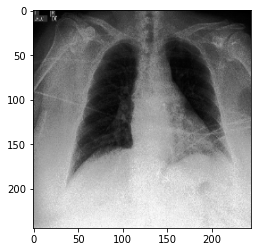

In [253]:
plt.imshow(tmp_tm0)

In [ ]:
#method = eval('cv2.TM_CCOEFF') # TM_CCOEFF is one of the methods. 
# Other methods include: cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR, cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED
    
tm_methods = [cv2.TM_CCOEFF, cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR, 
              cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]
tm_method_names = ['TM_CCOEFF', 'TM_CCOEFF_NORMED', 'TM_CCORR', 'TM_CCORR_NORMED', 'TM_SQDIFF', 'TM_SQDIFF_NORMED']

def tmplt_match(tm_method, method_name, template_3c):
    # Set a template figure for CXR
    #template_3c = cv2.imread(frontal10val[1])#cv2.imread(str(path_tmplt/'template1.jpg'))
    
    h,w,c = template_3c.shape # Dimension for the template
    template = cv2.cvtColor(template_3c, cv2.COLOR_BGR2GRAY)#template_3c[:,:,0]
    fig,axes = plt.subplots(1,4, figsize=(17,13))
    # Plot Template
    axes[0].imshow(template_3c)
    axes[0].set_title('Template')
    for i,fimg in enumerate(frontal10[6:9],1):
        img = cv2.imread(fimg)
        img256 = cv2.resize(img, (256,256), interpolation = cv2.INTER_LINEAR)
        img_gray = cv2.cvtColor(img256, cv2.COLOR_BGR2GRAY)
        #img_gray = cv2.cvtColor(img256, cv2.COLOR_BGR2GRAY)

        res = cv2.matchTemplate(img_gray, template, tm_method)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        #print(min_val, max_val, min_loc, max_loc)
        top_left = max_loc if tm_method not in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED] else min_loc 
        bottom_right = (top_left[0] + w, top_left[1]+h)
        
        cv2.rectangle(img256, top_left, bottom_right, 244, 1)
        #print(top_left,bottom_right)
        # Plotting
        axes[i].set_title(f'{method_name} Image #' + str(i).zfill(0))
        tl,tr,bl,br = top_left[0], top_left[1], bottom_right[0], bottom_right[1]
        print(tl,bl,tr,br,img256[tr:br,tl:bl].shape)
        axes[i].imshow(img256[tr:br,tl:bl])
    
    plt.tight_layout()
    plt.show()

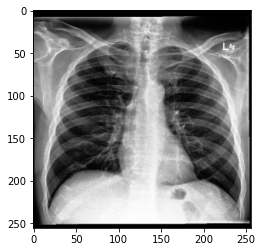

In [81]:
plt.imshow(cv2.resize(cv2.imread(frontal10val[1]), (256,256), interpolation = cv2.INTER_AREA))

In [90]:
resize_methods=[("area", cv2.INTER_AREA), 
         ("nearest", cv2.INTER_NEAREST), 
         ("linear", cv2.INTER_LINEAR), 
         ("cubic", cv2.INTER_CUBIC), 
         ("lanczos4", cv2.INTER_LANCZOS4)]

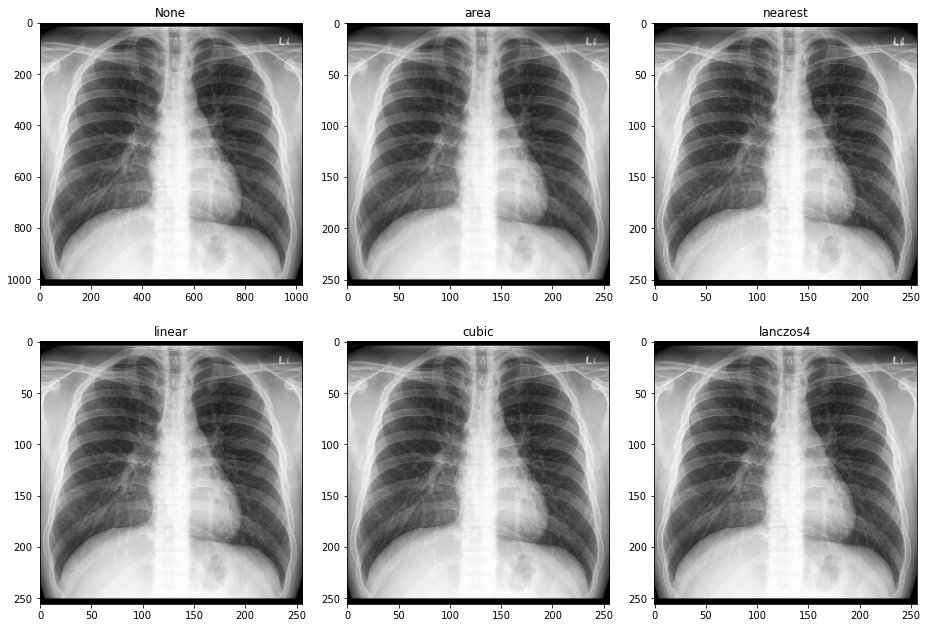

In [95]:
fig,axes = plt.subplots(2,3, figsize=(13,9))
axes[0,0].set_title('None')
axes[0,0].imshow(cv2.imread(ext_template))
for (name,method),ax in zip(resize_methods,axes.ravel()[1:]):
    ax.set_title(name)
    ax.imshow(cv2.resize(cv2.imread(ext_template), (256,256), interpolation=method))
plt.tight_layout()
plt.show()

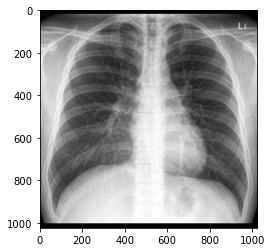

In [86]:
plt.imshow(cv2.imread(ext_template))

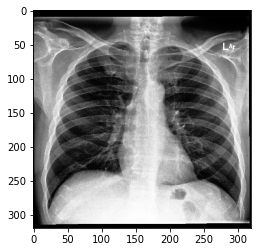

In [82]:
plt.imshow(cv2.imread(frontal10val[1]))

In [64]:
tmp_template = cv2.imread(str(path_tmplt/'template1.jpg'))

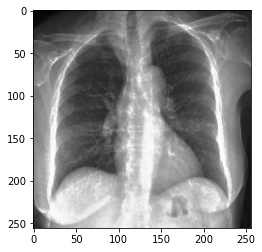

In [66]:
plt.imshow(cv2.resize(tmp_template, (256,256), interpolation = cv2.INTER_AREA))

In [171]:
#method = eval('cv2.TM_CCOEFF') # TM_CCOEFF is one of the methods. 
# Other methods include: cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR, cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED
    
tm_methods = [cv2.TM_CCOEFF, cv2.TM_CCOEFF_NORMED, cv2.TM_CCORR, 
              cv2.TM_CCORR_NORMED, cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]
tm_method_names = ['TM_CCOEFF', 'TM_CCOEFF_NORMED', 'TM_CCORR', 'TM_CCORR_NORMED', 'TM_SQDIFF', 'TM_SQDIFF_NORMED']

def tmplt_match(tm_method, method_name, template_3c):
    # Set a template figure for CXR
    #template_3c = cv2.imread(frontal10val[1])#cv2.imread(str(path_tmplt/'template1.jpg'))
    
    h,w,c = template_3c.shape # Dimension for the template
    template = cv2.cvtColor(template_3c, cv2.COLOR_BGR2GRAY)#template_3c[:,:,0]
    fig,axes = plt.subplots(1,4, figsize=(17,13))
    # Plot Template
    axes[0].imshow(template_3c)
    axes[0].set_title('Template')
    for i,fimg in enumerate(frontal10[6:9],1):
        img = cv2.imread(fimg)
        img256 = cv2.resize(img, (256,256), interpolation = cv2.INTER_LINEAR)
        img_gray = cv2.cvtColor(img256, cv2.COLOR_BGR2GRAY)
        #img_gray = cv2.cvtColor(img256, cv2.COLOR_BGR2GRAY)

        res = cv2.matchTemplate(img_gray, template, tm_method)
        min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)
        #print(min_val, max_val, min_loc, max_loc)
        top_left = max_loc if tm_method not in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED] else min_loc 
        bottom_right = (top_left[0] + w, top_left[1]+h)
        
        cv2.rectangle(img256, top_left, bottom_right, 244, 1)
        #print(top_left,bottom_right)
        # Plotting
        axes[i].set_title(f'{method_name} Image #' + str(i).zfill(0))
        tl,tr,bl,br = top_left[0], top_left[1], bottom_right[0], bottom_right[1]
        print(tl,bl,tr,br,img256[tr:br,tl:bl].shape)
        axes[i].imshow(img256[tr:br,tl:bl])
    
    plt.tight_layout()
    plt.show()

In [159]:
#plt.imsave(path_tmplt/'ext_template244.jpg',cv2.resize(cv2.imread(ext_template), (244,244), interpolation=cv2.INTER_LANCZOS4))
#plt.imsave(path_tmplt/'lat_ext_template244.jpg',cv2.resize(cv2.imread(ext_tmpl_lat), (244,244), interpolation=cv2.INTER_LANCZOS4))

5 249 0 244 (244, 244, 3)
12 256 12 256 (244, 244, 3)
5 249 12 256 (244, 244, 3)


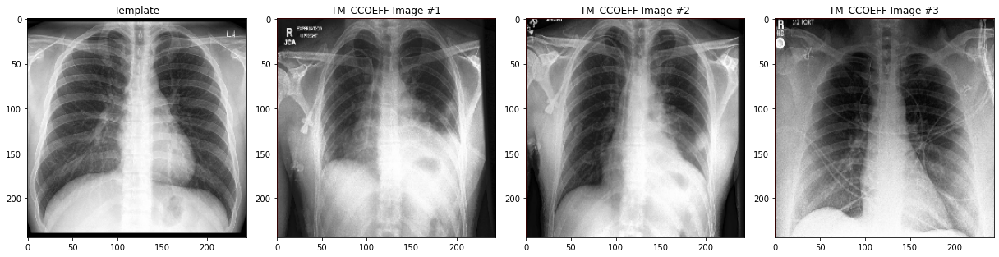

0 244 0 244 (244, 244, 3)
12 256 12 256 (244, 244, 3)
4 248 12 256 (244, 244, 3)


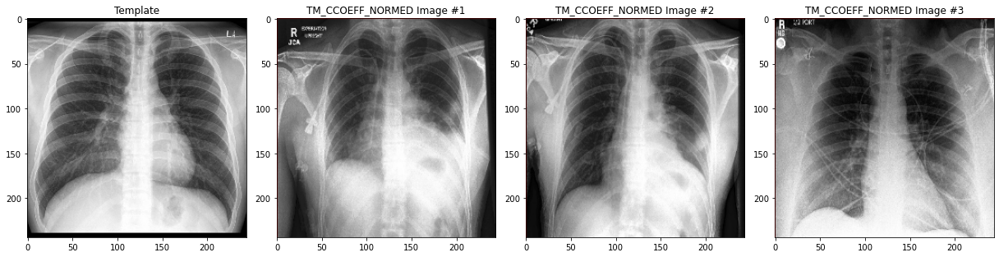

0 244 12 256 (244, 244, 3)
6 250 12 256 (244, 244, 3)
9 253 12 256 (244, 244, 3)


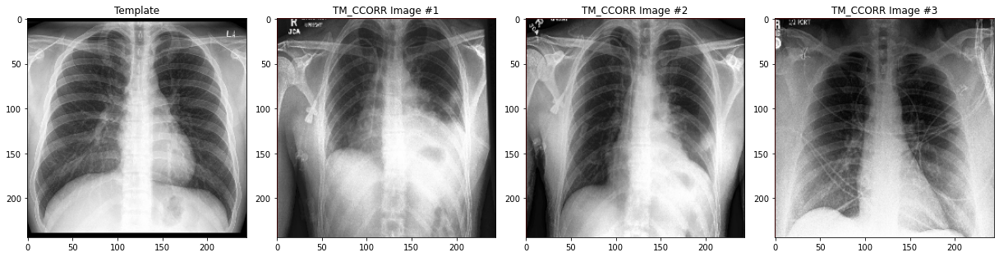

0 244 0 244 (244, 244, 3)
8 252 12 256 (244, 244, 3)
4 248 12 256 (244, 244, 3)


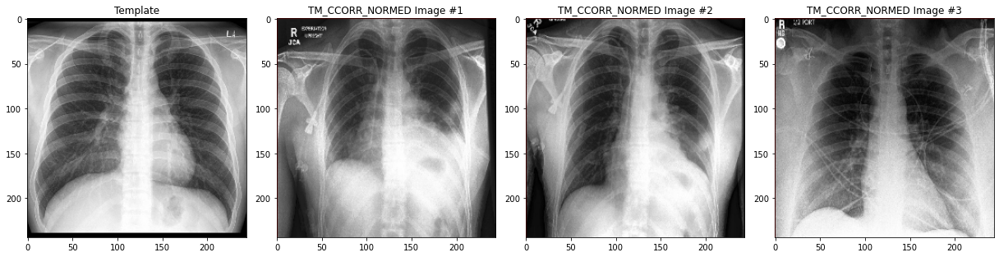

0 244 0 244 (244, 244, 3)
8 252 12 256 (244, 244, 3)
3 247 12 256 (244, 244, 3)


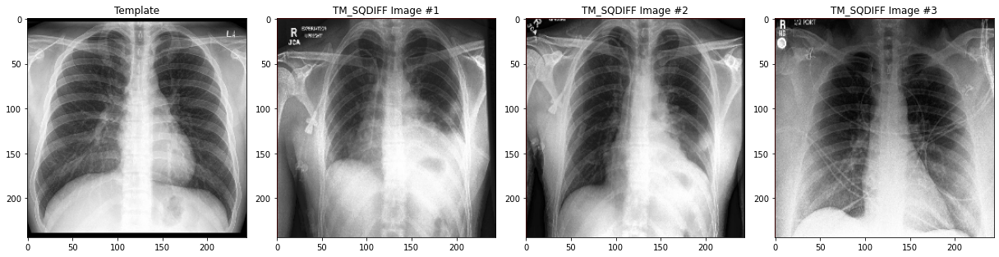

In [172]:
ext_tmpl_frnt = str(path_tmplt/'external_template1.jpg')
ext_tmpl_lat = str(path_tmplt/'ext_lateral_trim.png')
ext_tmpl_front244 = cv2.resize(cv2.imread(ext_tmpl_frnt), (244,244), interpolation=cv2.INTER_LANCZOS4)
ext_tmpl_lat244 = cv2.resize(cv2.imread(ext_tmpl_lat), (244,244), interpolation=cv2.INTER_LANCZOS4)
#val_tmpl_lanc = cv2.resize(cv2.imread(frontal10val[1]), (244,244), interpolation=cv2.INTER_LANCZOS4)

for name,tm_method in [*zip(tm_method_names,tm_methods)][:5]:
    tmplt_match(tm_method, name, ext_tmpl_front244)